SETUP - Importing Libraries

In [1]:
import os
import torchaudio
import soundfile as sf
import matplotlib.pyplot as plt
from IPython.display import Audio

DATASET PATH AND CATEGORIES - Define Dataset Paths and Categories

In [2]:
dataset_base_path = './dataset'
categories = ['ReadText', 'SpontaneousDialogue']

Print Sample Rates of Audio Files

In [3]:
for category in categories:
    category_path = os.path.join(dataset_base_path, category)

    for section in os.listdir(category_path):
        section_path = os.path.join(category_path, section)
        if os.path.isdir(section_path):
            for filename in os.listdir(section_path):
                if filename.endswith('.wav'):
                    file_path = os.path.join(section_path, filename)
                    data, sample_rate = sf.read(file_path, dtype='float32')
                    print(f"The sample rate of {filename} in {section} of {category} is: {sample_rate} Hz")

The sample rate of ID00_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID01_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID03_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID05_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID08_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID09_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID10_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID11_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID12_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID14_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID15_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID19_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID21_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID22_hc_0_0_0.wav in HC of ReadText is: 44100 Hz
The sample rate of ID23_hc_0_0_0.wav in HC of Re

AUDIO PLOTTING FUNCTION - Function to Plot Audio Waveform

In [4]:
def plot_audio(filename):
    waveform, sample_rate = torchaudio.load(filename)
    plt.figure(figsize=(12, 4))
    plt.plot(waveform.t().numpy())
    plt.title("Waveform")
    plt.xlabel("Sample")
    plt.ylabel("Amplitude")
    plt.show()
    return waveform, sample_rate

TARGET CATEGORY AND SECTION - Plot and Play Audio from Target Category and Section

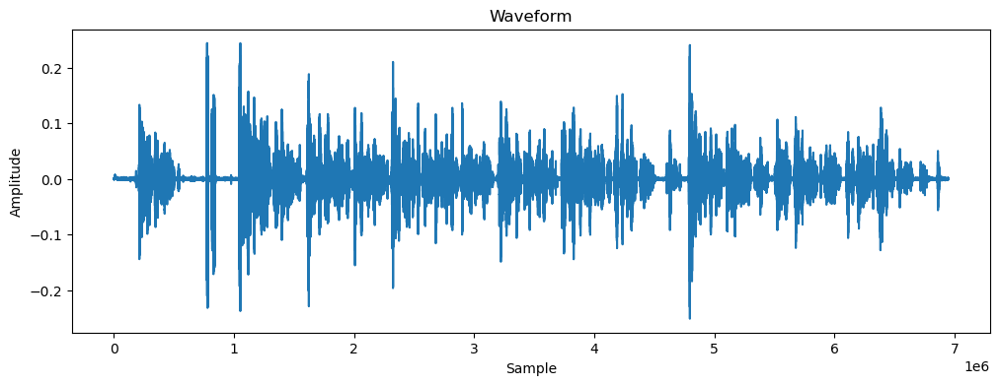

In [5]:
target_category = 'ReadText'
target_section = 'PD'
target_path = os.path.join(dataset_base_path, target_category, target_section)

for filename in os.listdir(target_path):
    if filename.endswith('.wav'):
        file_path = os.path.join(target_path, filename)
        waveform, sample_rate = plot_audio(file_path)
        display(Audio(waveform.numpy(), rate=sample_rate))
        break

SEGMENTATION START TIMES - Define Start Times for Segmentation

In [6]:
import os
import torch
import torchaudio
import torchaudio.transforms as T
from torch.utils.data import Dataset, DataLoader, random_split
import torch.nn as nn
import torch.nn.functional as F

class AudioDataset(Dataset):
    def __init__(self, dataset_base_path, categories, start_seconds, segment_length_sec=1, overlap_perc=0.4,
                 target_sample_rate=16000, n_mfcc=40, augmentation=True):
        self.segments = []
        self.labels = []
        self.subject_ids = []
        self.segment_length_sec = segment_length_sec
        self.overlap_perc = overlap_perc
        self.target_sample_rate = target_sample_rate
        self.n_mfcc = n_mfcc
        self.augmentation = augmentation

        self.mfcc_transform = T.MFCC(sample_rate=target_sample_rate, n_mfcc=n_mfcc)
        self.delta_transform = T.ComputeDeltas()
        self.augment_transform = nn.Sequential(
            T.FrequencyMasking(freq_mask_param=15),
            T.TimeMasking(time_mask_param=35)
        )

        for category in categories:
            category_path = os.path.join(dataset_base_path, category)
            for section in ['HC', 'PD']:
                section_path = os.path.join(category_path, section)
                for recording_id, start_second in start_seconds[category][section].items():
                    filepath = os.path.join(section_path, recording_id)
                    if os.path.exists(filepath):
                        metadata = self._parse_filename_metadata(recording_id)
                        waveform, original_rate = torchaudio.load(filepath)
                        start_frame = int(start_second * original_rate)
                        total_frames = waveform.size(1) - start_frame
                        segment_length = int(segment_length_sec * original_rate)
                        segment_step = int(segment_length * (1 - overlap_perc))

                        for start in range(start_frame, total_frames, segment_step):
                            if start + segment_length <= total_frames:
                                self.segments.append((filepath, start, segment_length))
                                self.subject_ids.append(metadata['subject_id'])
                                self.labels.append(metadata['health_status'])

    def _parse_filename_metadata(self, filename):
        parts = filename.split('_')
        return {'subject_id': parts[0], 'health_status': parts[1].lower()}

    def __len__(self):
        return len(self.segments)

    def __getitem__(self, idx):
        filepath, segment_start, segment_length = self.segments[idx]
        waveform, original_rate = torchaudio.load(filepath, frame_offset=segment_start, num_frames=segment_length)

        if original_rate != self.target_sample_rate:
            resample_transform = T.Resample(orig_freq=original_rate, new_freq=self.target_sample_rate)
            waveform = resample_transform(waveform)

        mfcc = self.mfcc_transform(waveform)
        delta = self.delta_transform(mfcc)
        delta_delta = self.delta_transform(delta)
        features = torch.cat((mfcc, delta, delta_delta), dim=0)  # Stack along the channel dimension

        if self.augmentation:
            features = self.augment_transform(features)

        features = (features - features.mean()) / features.std()

        label = 0 if self.labels[idx] == 'hc' else 1

        return features, torch.tensor(label, dtype=torch.long)

dataset_base_path = './dataset'
categories = ['ReadText', 'SpontaneousDialogue']
start_seconds = {
    'ReadText': {
        'HC': {
            'ID00_hc_0_0_0.wav': 16,
            'ID01_hc_0_0_0.wav': 26,
            'ID03_hc_0_0_0.wav': 25,
            'ID05_hc_0_0_0.wav': 21,
            'ID08_hc_0_0_0.wav': 26,
            'ID09_hc_0_0_0.wav': 26,
            'ID10_hc_0_0_0.wav': 29,
            'ID11_hc_0_0_0.wav': 29,
            'ID12_hc_0_0_0.wav': 27,
            'ID14_hc_0_0_0.wav': 32,
            'ID15_hc_0_0_0.wav': 25,
            'ID19_hc_0_0_0.wav': 25,
            'ID21_hc_0_0_0.wav': 28,
            'ID22_hc_0_0_0.wav': 26,
            'ID23_hc_0_0_0.wav': 23,
            'ID25_hc_0_0_0.wav': 24,
            'ID26_hc_0_0_0.wav': 24,
            'ID28_hc_0_0_0.wav': 25,
            'ID31_hc_0_1_1.wav': 23,
            'ID35_hc_0_0_0.wav': 31,
            'ID36_hc_0_0_0.wav': 37,
        },
        'PD': {
            'ID02_pd_2_0_0.wav': 23,
            'ID04_pd_2_0_1.wav': 38,
            'ID06_pd_3_1_1.wav': 31,
            'ID07_pd_2_0_0.wav': 23,
            'ID13_pd_3_2_2.wav': 34,
            'ID16_pd_2_0_0.wav': 35,
            'ID17_pd_2_1_0.wav': 44,
            'ID18_pd_4_3_3.wav': 23,
            'ID20_pd_3_0_1.wav': 24,
            'ID24_pd_2_0_0.wav': 30,
            'ID27_pd_4_1_1.wav': 25,
            'ID29_pd_3_1_2.wav': 25,
            'ID30_pd_2_1_1.wav': 14,
            'ID32_pd_3_1_1.wav': 13,
            'ID33_pd_3_2_2.wav': 26,
            'ID34_pd_2_0_0.wav': 24,
        }
    },
    'SpontaneousDialogue': {
        'HC': {
            'ID00_hc_0_0_0.wav': 21,
            'ID01_hc_0_0_0.wav': 17,
            'ID03_hc_0_0_0.wav': 25,
            'ID05_hc_0_0_0.wav': 24,
            'ID08_hc_0_0_0.wav': 9,
            'ID09_hc_0_0_0.wav': 24,
            'ID10_hc_0_0_0.wav': 23,
            'ID11_hc_0_0_0.wav': 15,
            'ID12_hc_0_0_0.wav': 20,
            'ID14_hc_0_0_0.wav': 21,
            'ID15_hc_0_0_0.wav': 23,
            'ID19_hc_0_0_0.wav': 19,
            'ID21_hc_0_0_0.wav': 14,
            'ID22_hc_0_0_0.wav': 20,
            'ID23_hc_0_0_0.wav': 21,
            'ID25_hc_0_0_0.wav': 20,
            'ID26_hc_0_0_0.wav': 20,
            'ID28_hc_0_0_0.wav': 21,
            'ID31_hc_0_1_1.wav': 17,
            'ID35_hc_0_0_0.wav': 18,
            'ID36_hc_0_0_0.wav': 16
        },
        'PD': {
            'ID02_pd_2_0_0.wav': 17,
            'ID04_pd_2_0_1.wav': 22,
            'ID06_pd_3_1_1.wav': 25,
            'ID07_pd_2_0_0.wav': 24,
            'ID13_pd_3_2_2.wav': 24,
            'ID16_pd_2_0_0.wav': 25,
            'ID17_pd_2_1_0.wav': 23,
            'ID20_pd_3_0_1.wav': 22,
            'ID24_pd_2_0_0.wav': 24,
            'ID27_pd_4_1_1.wav': 20,
            'ID29_pd_3_1_2.wav': 25,
            'ID30_pd_2_1_1.wav': 33,
            'ID32_pd_3_1_1.wav': 24,
            'ID33_pd_3_2_2.wav': 17,
            'ID34_pd_2_0_0.wav': 19
        }
    }
}

dataset = AudioDataset(
    dataset_base_path=dataset_base_path,
    categories=categories,
    start_seconds=start_seconds
)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

C:\Users\Alexandra\anaconda3\envs\Parkinson\lib\site-packages\torchaudio\functional\functional.py:584: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


In [7]:
class CNNLSTM(nn.Module):
    def __init__(self, n_mfcc, num_classes, hidden_size=128, num_layers=2):
        super(CNNLSTM, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.5)
        self.lstm = nn.LSTM(input_size=64 * (n_mfcc // 2), hidden_size=hidden_size, num_layers=num_layers, batch_first=True, bidirectional=True)
        self.fc1 = nn.Linear(hidden_size * 2, 128)
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.dropout(x)
        x = x.permute(0, 2, 1, 3).contiguous()
        x = x.view(x.size(0), x.size(1), -1)
        x, _ = self.lstm(x)
        x = x[:, -1, :]
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNLSTM(n_mfcc=40, num_classes=2).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)  # L2 regularization added with weight_decay
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.1, patience=3, verbose=True)

In [8]:
def train(model, device, train_loader, optimizer, criterion, epoch):
    model.train()
    correct = 0
    total = 0
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        pred = output.argmax(dim=1, keepdim=True)
        correct += pred.eq(target.view_as(pred)).sum().item()
        total += target.size(0)

        if batch_idx % 10 == 0:
            print(f'Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} '
                  f'({100. * batch_idx / len(train_loader):.0f}%)]\tLoss: {loss.item():.6f} '
                  f'\tAccuracy: {100. * correct / total:.2f}%')

def test(model, device, test_loader, criterion):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            model.lstm.flatten_parameters()
            output = model(data)
            test_loss += criterion(output, target).item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    accuracy = 100. * correct / len(test_loader.dataset)
    print(f'\nTest set: Average loss: {test_loss:.4f}, Accuracy: {correct}/{len(test_loader.dataset)} '
          f'({accuracy:.0f}%)\n')
    
    return test_loss, accuracy

class EarlyStopping:
    def __init__(self, patience=7, min_delta=0, path='checkpoint.pt', verbose=True):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        self.path = path
        self.verbose = verbose

    def __call__(self, val_loss, model):
        if self.best_loss is None:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.path)
            if self.verbose:
                print(f'Initial model saved to {self.path}')
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
            torch.save(model.state_dict(), self.path)
            if self.verbose:
                print(f'Validation loss decreased to {val_loss:.6f}, model saved to {self.path}')
        else:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True

early_stopping = EarlyStopping(patience=10, path='./best_model.pth', verbose=True)

epoch = 0
while True:
    epoch += 1
    train(model, device, train_loader, optimizer, criterion, epoch)
    
    val_loss, val_accuracy = test(model, device, test_loader, criterion)
    scheduler.step(val_loss)  
    
    early_stopping(val_loss, model)  
    
    if early_stopping.early_stop:
        print("Early stopping triggered. Stopping training.")
        break

    if device == torch.device("cuda"):
        torch.cuda.empty_cache()

model.load_state_dict(torch.load('./best_model.pth'))
print("Training completed.")

Train Epoch: 1 [0/9067 (0%)]	Loss: 0.692373 	Accuracy: 51.56%
Train Epoch: 1 [640/9067 (7%)]	Loss: 0.673428 	Accuracy: 57.67%
Train Epoch: 1 [1280/9067 (14%)]	Loss: 0.633262 	Accuracy: 59.45%
Train Epoch: 1 [1920/9067 (21%)]	Loss: 0.675511 	Accuracy: 59.43%
Train Epoch: 1 [2560/9067 (28%)]	Loss: 0.646607 	Accuracy: 59.95%
Train Epoch: 1 [3200/9067 (35%)]	Loss: 0.635039 	Accuracy: 59.83%
Train Epoch: 1 [3840/9067 (42%)]	Loss: 0.674331 	Accuracy: 60.40%
Train Epoch: 1 [4480/9067 (49%)]	Loss: 0.673888 	Accuracy: 60.52%
Train Epoch: 1 [5120/9067 (56%)]	Loss: 0.654004 	Accuracy: 60.30%
Train Epoch: 1 [5760/9067 (63%)]	Loss: 0.690742 	Accuracy: 60.42%
Train Epoch: 1 [6400/9067 (70%)]	Loss: 0.684780 	Accuracy: 60.52%
Train Epoch: 1 [7040/9067 (77%)]	Loss: 0.589228 	Accuracy: 60.90%
Train Epoch: 1 [7680/9067 (85%)]	Loss: 0.700725 	Accuracy: 60.94%
Train Epoch: 1 [8320/9067 (92%)]	Loss: 0.615568 	Accuracy: 61.06%
Train Epoch: 1 [8960/9067 (99%)]	Loss: 0.596951 	Accuracy: 61.34%

Test set: Avera